<i>Copyright (c) Microsoft Corporation. All rights reserved.</i>

<i>Licensed under the MIT License.</i>

# Quickstart: Web Cam Multi-Object Tracking


Multi-Object tracking is the canonical computer vision task of associating multiple detected objects from one frame to another within a video or a sequence of images.

This notebook shows a simple example of loading a pretrained JDE model for multi-object tracking from a webcam stream using the `torchvision` package. #TODO: edit if different model.

To understand the basics of Multi-Object-Tracking, please visit our #TODO [FAQ](FAQ.md).  For more details about the underlying technology of object tracking tasks, including finetuning, please see our #TODO [training introduction notebook](01_training_introduction.ipynb).

## Prerequisite for Webcam example 
This notebook assumes you have **a webcam** connected to your machine.  We use the `ipywebrtc` module to show the webcam widget in the notebook. Currently, the widget works on **Chrome** and **Firefox**. For more details about the widget, please visit `ipywebrtc` [github](https://github.com/maartenbreddels/ipywebrtc) or [documentation](https://ipywebrtc.readthedocs.io/en/latest/).

## Initialization

In [1]:
# Regular Python libraries
import io
import os
import sys
import time
import urllib.request
import matplotlib.pyplot as plt

# IPython
import scrapbook as sb
from ipywebrtc import CameraStream, ImageRecorder, VideoStream, VideoRecorder
from ipywidgets import HBox, Layout, widgets, Widget, VBox
from ipywidgets import Video #KIP
# Image
from PIL import Image

# TorchVision
import torchvision
from torchvision import transforms as T

# KIP: utils_cv
sys.path.append("../../")
from utils_cv.multi_object_tracking.display_with_bb import process_video, process_images
from utils_cv.multi_object_tracking.file_format import func_extractBBoxes_fromXML, func_convertLTRB_toXYWH
from utils_cv.multi_object_tracking.convert_seq_vid import vid_to_seq, seq_to_vid
from utils_cv.multi_object_tracking.baseline import baseline_algorithm

# utils_cv
# sys.path.append("../../")
from utils_cv.common.data import data_path
from utils_cv.common.gpu import which_processor, is_windows
from utils_cv.detection.data import coco_labels
from utils_cv.detection.model import DetectionLearner
from utils_cv.detection.plot import PlotSettings, plot_boxes

# Change matplotlib backend so that plots are shown for windows
if is_windows():
    plt.switch_backend('TkAgg')

print(f"TorchVision: {torchvision.__version__}")
which_processor()

ModuleNotFoundError: No module named 'scrapbook'

In [3]:
list_coco = [
        "__background__",
        "person",
        "bicycle",
        "car",
        "motorcycle",
        "airplane",
        "bus",
        "train",
        "truck",
        "boat",
        "traffic light",
        "fire hydrant",
        "N/A",
        "stop sign",
        "parking meter",
        "bench",
        "bird",
        "cat",
        "dog",
        "horse",
        "sheep",
        "cow",
        "elephant",
        "bear",
        "zebra",
        "giraffe",
        "N/A",
        "backpack",
        "umbrella",
        "N/A",
        "N/A",
        "handbag",
        "tie",
        "suitcase",
        "frisbee",
        "skis",
        "snowboard",
        "sports ball",
        "kite",
        "baseball bat",
        "baseball glove",
        "skateboard",
        "surfboard",
        "tennis racket",
        "bottle",
        "N/A",
        "wine glass",
        "cup",
        "fork",
        "knife",
        "spoon",
        "bowl",
        "banana",
        "apple",
        "sandwich",
        "orange",
        "broccoli",
        "carrot",
        "hot dog",
        "pizza",
        "donut",
        "cake",
        "chair",
        "couch",
        "potted plant",
        "bed",
        "N/A",
        "dining table",
        "N/A",
        "N/A",
        "toilet",
        "N/A",
        "tv",
        "laptop",
        "mouse",
        "remote",
        "keyboard",
        "cell phone",
        "microwave",
        "oven",
        "toaster",
        "sink",
        "refrigerator",
        "N/A",
        "book",
        "clock",
        "vase",
        "scissors",
        "teddy bear",
        "hair drier",
        "toothbrush",
    ]
print(len(list_coco))
"can" in list_coco

91


False

This shows your machine's GPUs (if it has any) and the computing device `torch/torchvision` is using.

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Load Pretrained Models

## Detector model


We first load the repo's detector model, pretrained (on COCO dataset), and then pass it into our DetectionLearner object, and add the pre-defined coco-labels. For an in-depth coverage on detectors, please refer to the [00_webcam notebook](https://github.com/microsoft/computervision-recipes/blob/master/scenarios/detection/00_webcam.ipynb) in the detection scenario.

In [43]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
    pretrained=True,
    rpn_pre_nms_top_n_test = 5,
    rpn_post_nms_top_n_test = 5,
    max_size=200,
)

Next, we just need to pass this model into our `DetectionLearner` object, and add the pre-defined coco-labels.

In [44]:
detector = DetectionLearner(
    model=model, 
    labels=coco_labels()[1:],  # we use [1:] because the first element of the array is '__background__'
)

## Tracking model

We first load our JDE tracking model, pretrained (on MOT challenge dataset #TODO, ask Liqun).
#TODO add about JDE model architecture, detection and re-id head).
#TODO add about dataset pretrained on.

In [ ]:
model = func_import_jdemodel(...) #TODO: check with Casey

 Next, we pass our loaded tracking model into our TrackingLearner object

In [ ]:
mytracker = TrackingLearner(
    model=model    
)

# Object Tracking

## From Video File

To illustrate, a simple example of tracking objects, we use a video of a person drinking. 

In [7]:
# Download an example video file
VID_URL = "https://cvbp.blob.core.windows.net/public/datasets/action_recognition/drinking.mp4"
vid_path = os.path.join(data_path(), "example_vid.mp4")
urllib.request.urlretrieve(VID_URL, vid_path)

from ipywidgets import Video
video = Video.from_file(vid_path)
video

vid_path: /data/home/maidapmot/computervision-recipes/data/example_vid.mp4


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00RP\xa8mdat\x00\x00\…

To illustrate the effect of tracking only, we can take in the detections in the video as an input. To do that we can either use a standard detector, or use manually annotated frames using an annotation tool (e.g. VOTT). 

### Using manual annotation

After manual annotation, the video sequence can be as follows:

In [4]:
labels_path = "../../../blob_karineMOT/drinking_vid/drinking_vid_annot/vott-csv-export/Drinking_vid-export.csv"
save_path = "../../../blob_karineMOT/drinking_vid/drinking_annot.mp4"
fps = 2
labels_format = "pascal_voc"
img_path = "../../../blob_karineMOT/drinking_vid/drinking_vid_annot/vott-csv-export/"
process_video(vid_path, labels_path, save_path, fps, labels_format, img_path, False)

from ipywidgets import Video, Image
video = Video.from_file(save_path)
video

video_path: /data/home/maidapmot/computervision-recipes/data/example_vid.mp4
video fps: 24.0


Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00\x0c\x138mdat\x00\x0…

In [6]:
# Run baseline tracking algorithm with euclidean distance
detection_path = "../../../blob_karineMOT/drinking_vid/drinking_vid_annot/vott-csv-export/Drinking_vid-export.csv"
output_dir = "../../../blob_karineMOT/drinking_vid/"
method = "greedy"
detection_format = "pascal_voc"
baseline_algorithm(detection_path, output_dir, method, detection_format)

                     image        xmin        ymin         xmax         ymax  \
0     drinking.mp4#t=0.jpg  583.924975    2.182516  1011.872398   475.222522   
1     drinking.mp4#t=1.jpg  832.480322  534.982489  1060.863039  1074.982544   
2     drinking.mp4#t=1.jpg  906.686723   67.702505  1221.523474   569.542511   
3     drinking.mp4#t=2.jpg  818.071317  530.662500  1032.765522  1056.262500   
4     drinking.mp4#t=2.jpg  874.986845   53.302505  1197.028209   565.222522   
5   drinking.mp4#t=0.5.jpg  763.317051  415.462500   965.043130  1004.422522   
6   drinking.mp4#t=0.5.jpg  859.136961   46.102505  1181.178214   532.102533   
7   drinking.mp4#t=1.5.jpg  818.791811  530.662500  1035.647280  1062.022522   
8   drinking.mp4#t=1.5.jpg  883.632336   59.062500  1194.866836   554.422522   
9     drinking.mp4#t=4.jpg  979.452136  270.742511  1228.727977   449.302533   
10    drinking.mp4#t=4.jpg  806.544068   75.622495  1094.003796   528.502533   
11  drinking.mp4#t=4.5.jpg  967.204503  

In [74]:
# Run baseline tracking algorithm with euclidean distance --> test output
detection_path = "../../../blob_karineMOT/drinking_vid/drinking_vid_annot/vott-csv-export/Drinking_vid-export.csv"
output_dir = "../../../blob_karineMOT/drinking_vid/"
method = "greedy"
detection_format = "pascal_voc"
baseline_algorithm(detection_path, output_dir, method, detection_format, False)

                     image        xmin        ymin         xmax         ymax  \
0     drinking.mp4#t=0.jpg  583.924975    2.182516  1011.872398   475.222522   
1     drinking.mp4#t=1.jpg  832.480322  534.982489  1060.863039  1074.982544   
2     drinking.mp4#t=1.jpg  906.686723   67.702505  1221.523474   569.542511   
3     drinking.mp4#t=2.jpg  818.071317  530.662500  1032.765522  1056.262500   
4     drinking.mp4#t=2.jpg  874.986845   53.302505  1197.028209   565.222522   
5   drinking.mp4#t=0.5.jpg  763.317051  415.462500   965.043130  1004.422522   
6   drinking.mp4#t=0.5.jpg  859.136961   46.102505  1181.178214   532.102533   
7   drinking.mp4#t=1.5.jpg  818.791811  530.662500  1035.647280  1062.022522   
8   drinking.mp4#t=1.5.jpg  883.632336   59.062500  1194.866836   554.422522   
9     drinking.mp4#t=4.jpg  979.452136  270.742511  1228.727977   449.302533   
10    drinking.mp4#t=4.jpg  806.544068   75.622495  1094.003796   528.502533   
11  drinking.mp4#t=4.5.jpg  967.204503  

array([0, 3, 2, 1])
(Pdb) exit()


BdbQuit: 

In [81]:
# Run baseline tracking algorithm with IOU
detection_path = "../../../blob_karineMOT/drinking_vid/drinking_vid_annot/vott-csv-export/Drinking_vid-export.csv"
output_dir = "../../../blob_karineMOT/drinking_vid/"
method = "greedy"
detection_format = "pascal_voc"
baseline_algorithm(detection_path, output_dir, method, detection_format, True)

                     image        xmin        ymin         xmax         ymax  \
0     drinking.mp4#t=0.jpg  583.924975    2.182516  1011.872398   475.222522   
1     drinking.mp4#t=1.jpg  832.480322  534.982489  1060.863039  1074.982544   
2     drinking.mp4#t=1.jpg  906.686723   67.702505  1221.523474   569.542511   
3     drinking.mp4#t=2.jpg  818.071317  530.662500  1032.765522  1056.262500   
4     drinking.mp4#t=2.jpg  874.986845   53.302505  1197.028209   565.222522   
5   drinking.mp4#t=0.5.jpg  763.317051  415.462500   965.043130  1004.422522   
6   drinking.mp4#t=0.5.jpg  859.136961   46.102505  1181.178214   532.102533   
7   drinking.mp4#t=1.5.jpg  818.791811  530.662500  1035.647280  1062.022522   
8   drinking.mp4#t=1.5.jpg  883.632336   59.062500  1194.866836   554.422522   
9     drinking.mp4#t=4.jpg  979.452136  270.742511  1228.727977   449.302533   
10    drinking.mp4#t=4.jpg  806.544068   75.622495  1094.003796   528.502533   
11  drinking.mp4#t=4.5.jpg  967.204503  

(Pdb) c


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [6]:
# Convert .txt results to video
vid_annot_path = "../../../blob_karineMOT/drinking_vid/drinking_annot.mp4"
labels_path = "../../../blob_karineMOT/drinking_vid/greedy_output_Drinking_vid-export.csv"
save_path = "../../../blob_karineMOT/drinking_vid/drinking_annot_tracked.mp4"
output_fps = 2
labels_format = "mot_challenge"
img_path = "../../../blob_karineMOT/drinking_vid/drinking_vid_annot/vott-csv-export/"
process_video(vid_annot_path, labels_path, save_path, output_fps, labels_format, img_path)

from ipywidgets import Video, Image
video = Video.from_file(save_path)
video

video_path: ../../../blob_karineMOT/drinking_vid/drinking_annot.mp4
video fps: 2.0


Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00\x0b\xd2\xbdmdat\x00…

In [62]:
# Convert .txt results to video
vid_path = "../../../blob_karineMOT/drinking_vid/drinking.mp4"
labels_path = "../../../blob_karineMOT/drinking_vid/greedy_output_Drinking_vid-export.csv"
save_path = "../../../blob_karineMOT/drinking_vid/drinking_tracked.mp4"
output_fps = 2
labels_format = "mot_challenge"
img_path = "../../../blob_karineMOT/drinking_vid/drinking_vid_annot/vott-csv-export/"
process_video(vid_path, labels_path, save_path, output_fps, labels_format, img_path)

from ipywidgets import Video, Image
video = Video.from_file(save_path)
video

[autoreload of utils_cv.multi_object_tracking.display_with_bb failed: Traceback (most recent call last):
  File "/data/anaconda/envs/env_cvbpMOT/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/data/anaconda/envs/env_cvbpMOT/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
  File "/data/anaconda/envs/env_cvbpMOT/lib/python3.7/imp.py", line 314, in reload
    return importlib.reload(module)
  File "/data/anaconda/envs/env_cvbpMOT/lib/python3.7/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 630, in _exec
  File "<frozen importlib._bootstrap_external>", line 724, in exec_module
  File "<frozen importlib._bootstrap_external>", line 860, in get_code
  File "<frozen importlib._bootstrap_external>", line 791, in source_to_code
  File "<frozen importlib._bootstrap>",

video_path: ../../../blob_karineMOT/drinking_vid/drinking.mp4
video fps: 24.0


Video(value=b'\x00\x00\x00\x1cftypisom\x00\x00\x02\x00isomiso2mp41\x00\x00\x00\x08free\x00-dWmdat\x00\x00\x01\…

### Using repo's detector
For an in-depth coverage or how to used a pre-trained detector, please refer to the [00_webcam notebook](https://github.com/microsoft/computervision-recipes/blob/master/scenarios/detection/00_webcam.ipynb) in the detection scenario. <br>

First, we convert the video to a sequence of image that the detector can process. 


In [6]:
# Convert video to image sequence and produce frame_list
fps = 24 # in fps,check the video's fps in its properties
vid_path = "../../../blob_karineMOT/drinking_vid/drinking.mp4"
seq_dir = "../../../blob_karineMOT/drinking_vid/images/"
vid_to_seq(seq_dir, vid_path, fps)

frame_list = os.listdir(seq_dir)

Using the `predict()` method on each image in the sequence, we ask the model to detect how many objects and what they are on each image.

/data/anaconda/envs/cv/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


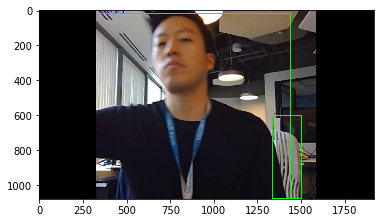

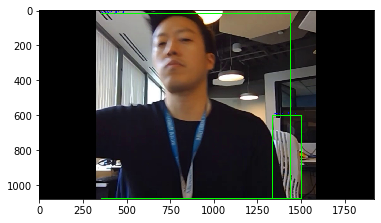

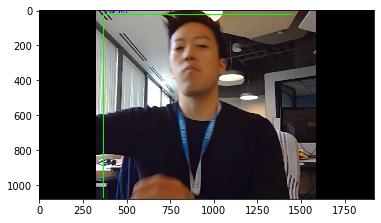

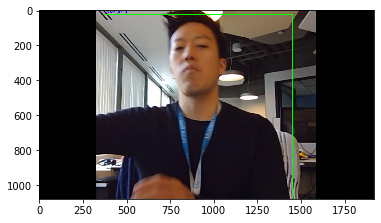

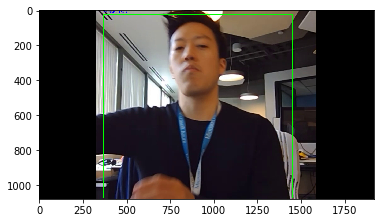

...

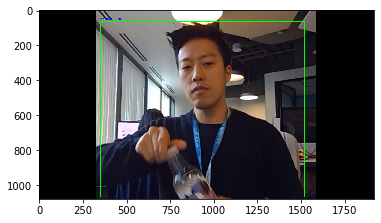

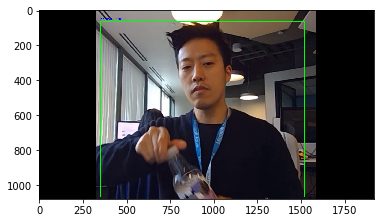

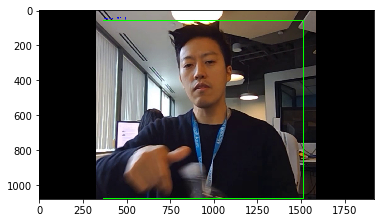

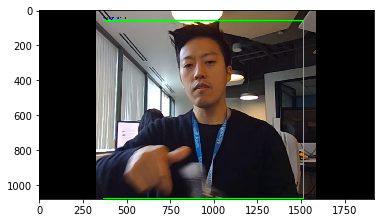

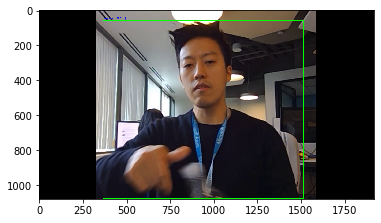

In [72]:
# For each image in the sequence, run the detector and compile into a results' .txt file, as well as an image directory with the detections:

import numpy as np

seq_dir = "../../../blob_karineMOT/drinking_vid/images/"
det_xywh_file = "../../../blob_karineMOT/drinking_vid/detcvbp_xywh.txt"
save_img_path = "../../../blob_karineMOT/drinking_vid/images_cvbpdet/"

if not os.path.exists(save_img_path): os.mkdir(save_img_path)
with open(det_xywh_file, 'w') as f:
    print("frame,id,left,top,right,bottom",file=f)
    
    for img_i in os.listdir(seq_dir):   
        im = Image.open(os.path.join(seq_dir,img_i))    
        detections = detector.predict(im, 0.3)

        #Extract info to .txt file
        for det_i in detections["det_bboxes"]:
                print('%s,-1,%.2f,%.2f,%.2f,%2f,%.5f,%s' % (img_i, det_i.left, det_i.top, det_i.right, det_i.bottom, det_i.score, str(det_i.label_idx)+"-"+det_i.label_name), file =f)

        #Print img with detection
        img_res = plot_boxes(im, detections["det_bboxes"], plot_settings=PlotSettings(rect_color=(0, 255, 0)))
        img_res.save(os.path.join(save_img_path, img_i))
        
        #plt.figure()
        #plt.imshow(np.asarray(img_res))
        
        


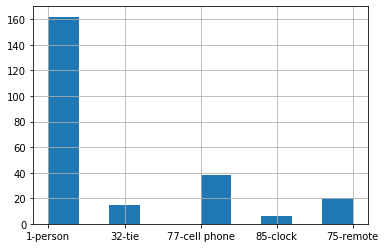

In [9]:
# Analyze detections
import pandas as pd

det_xywh_file = "../../../blob_karineMOT/drinking_vid/detcvbp_xywh.txt"
df1 = pd.read_csv(det_xywh_file)
df1.head()
df1.bottom.hist()

In [73]:
# Convert image sequence to video
fps = 24 
seq_dir =  "../../../blob_karineMOT/drinking_vid/images_cvbpdet/"
vid_path =  "../../../blob_karineMOT/drinking_vid/drinking_cvbpdet.mp4"
seq_to_vid(seq_dir, vid_path, fps)

frame_list = os.listdir(seq_dir)

Using the `predict_dl()` method, we ask the model to process in batch the image sequences, and in each imagedetect how many objects and what they are on each image.

In [36]:
import numpy as np
import cv2

seq_dir = "../../../blob_karineMOT/drinking_vid/images/"
frame_list = os.listdir(seq_dir)

images=[]
for img in os.listdir(seq_dir):
        images.append(cv2.imread(seq_dir+img))
images_arr = np.array(images, dtype='int32')        

In [37]:
# Run detector by loading batch of images, run with TensorDataset
#train = torch.utils.data.TensorDataset(torch.from_numpy(X_train), torch.from_numpy(Y_train))
#torch.from_numpy(numpy.array(images_batch))

import torch
drinkvid_tensor = torch.utils.data.TensorDataset(torch.from_numpy(images_arr), "") #torch.from_numpy(images_arr) #data_utils.TensorDataset(features, targets)
drinkvid_DL = DataLoader(drinkvid_tensor, batch_size=4,
                        shuffle=True, num_workers=4)

detections_batch = detector.predict_dl(drinkvid_DL)

AttributeError: 'str' object has no attribute 'size'

In [25]:
import pandas as pd
from PIL import Image #import matplotlib.image as mpimg
import os
from torch.utils.data import Dataset, DataLoader
import torch.utils.data as data_utils
from torchvision import transforms

class ImgSequenceDataset(Dataset):
    """Image sequence dataset."""

    def __init__(self, frame_list, img_dir, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.frame_list =frame_list
        self.img_dir = img_dir
        self.transform = transform



    def __len__(self):
        return len(self.frame_list)

    def __getitem__(self, idx):
        im_path = os.path.join(self.img_dir, self.frame_list[idx])
        im = Image.open(im_path).convert("RGB")
        print(self.frame_list[idx], "image type:", type(im))
        
        sample = {'image': im}#, 'label': ''}
        
        if self.transform:
            sample = self.transform(sample)            
                                                  
        return sample
        #return im #, dict()
      

In [28]:
# Run detector by loading batch of images, run with Transform.Compose()

drinkvid_dataset= ImgSequenceDataset(frame_list=frame_list, img_dir = seq_dir, transform=transforms.Compose([ToTensor()])
        )
drinkvid_DL = DataLoader(drinkvid_dataset, batch_size=4,
                        shuffle=True, num_workers=4)

detections_batch = detector.predict_dl(drinkvid_DL)

NameError: name 'ToTensor' is not defined

In [19]:
# Run detector by loading batch of images, running acc to format in dataset.py

drinkvid_dataset= ImgSequenceDataset(frame_list=frame_list, img_dir = seq_dir)
drinkvid_DL = DataLoader(drinkvid_dataset, batch_size=4,
                        shuffle=True, num_workers=4)

detections_batch = detector.predict_dl(drinkvid_DL)

in here
frame000082.jpg image type: <class 'PIL.Image.Image'>
frame000144.jpg image type: <class 'PIL.Image.Image'>
frame000107.jpg image type: <class 'PIL.Image.Image'>
frame000011.jpg image type: <class 'PIL.Image.Image'>
frame000149.jpg image type: <class 'PIL.Image.Image'>
frame000068.jpg image type: <class 'PIL.Image.Image'>
frame000115.jpg image type: <class 'PIL.Image.Image'>
frame000134.jpg image type: <class 'PIL.Image.Image'>
frame000046.jpg image type: <class 'PIL.Image.Image'>
frame000127.jpg image type: <class 'PIL.Image.Image'>
frame000018.jpg image type: <class 'PIL.Image.Image'>
frame000032.jpg image type: <class 'PIL.Image.Image'>
frame000024.jpg image type: <class 'PIL.Image.Image'>
frame000052.jpg image type: <class 'PIL.Image.Image'>
frame000031.jpg image type: <class 'PIL.Image.Image'>
frame000150.jpg image type: <class 'PIL.Image.Image'>
frame000122.jpg image type: <class 'PIL.Image.Image'>
frame000067.jpg image type: <class 'PIL.Image.Image'>
frame000139.jpg imag

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eff454db170>
Traceback (most recent call last):
  File "/data/anaconda/envs/cv/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 926, in __del__
    self._shutdown_workers()
  File "/data/anaconda/envs/cv/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 906, in _shutdown_workers
    w.join()
  File "/data/anaconda/envs/cv/lib/python3.7/multiprocessing/process.py", line 140, in join
    res = self._popen.wait(timeout)
  File "/data/anaconda/envs/cv/lib/python3.7/multiprocessing/popen_fork.py", line 48, in wait
    return self.poll(os.WNOHANG if timeout == 0.0 else 0)
  File "/data/anaconda/envs/cv/lib/python3.7/multiprocessing/popen_fork.py", line 28, in poll
    pid, sts = os.waitpid(self.pid, flag)
KeyboardInterrupt: 


TypeError: Caught TypeError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/data/anaconda/envs/cv/lib/python3.7/site-packages/torch/utils/data/_utils/worker.py", line 178, in _worker_loop
    data = fetcher.fetch(index)
  File "/data/anaconda/envs/cv/lib/python3.7/site-packages/torch/utils/data/_utils/fetch.py", line 47, in fetch
    return self.collate_fn(data)
  File "/data/anaconda/envs/cv/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py", line 82, in default_collate
    raise TypeError(default_collate_err_msg_format.format(elem_type))
TypeError: default_collate: batch must contain tensors, numpy arrays, numbers, dicts or lists; found <class 'PIL.Image.Image'>


In [18]:
print(detections.keys())
print(detections.get("det_bboxes"),"....\n")
print(detections.get("im_path"))
print(type(detections.get("det_bboxes")[0]))

dict_keys(['det_bboxes', 'im_path'])
[{Bbox object: [left=364, top=59, right=1516, bottom=1079] | <person> | label:1 | path:None} | score: 0.9883586168289185] ....

None
<class 'utils_cv.detection.bbox.DetectionBbox'>


In [ ]:
plot_boxes(im, detections["det_bboxes"], plot_settings=PlotSettings(rect_color=(0, 255, 0)))

In [ ]:
detections

## From Images' xml folder, with detections

In [25]:
# Convert xml files to file in .txt file with each image file label
anno_path = "../../../blob_karineMOT/odFridgeObjects/annotations/"
im_path = "../../../blob_karineMOT/odFridgeObjects/images/"
det_xywh_file = "../../../blob_karineMOT/odFridgeObjects/det_xywh.txt"
    
file_list = sorted(os.listdir(anno_path), key = lambda x:int(x.split(".")[0]))
print(file_list)
count_frame = 1
frame_list=[]

with open(det_xywh_file, 'w') as f:
    print("frame,id,left,top,right,bottom",file=f)
    for file_i in file_list:      
        #Extract from XML
        anno_bboxes = func_extractBBoxes_fromXML(os.path.join(anno_path, file_i))

        #Convert to XYWH format (MOTchallenge)
        #anno_bboxes2 = func_convertLTRB_toXYWH(anno_bboxes)

        #Output to single .csv file in format |frame|id|x|y|w|h|
        for i, row in enumerate(anno_bboxes):
            print(file_i, ", row: ", row)
            print('%s,-1,%.5f,%.5f,%.5f,%.5f' % (count_frame, row[0], row[1], row[2], row[3]), file=f)

        frame_list.append(count_frame)
        count_frame += 1

        image_frame_dict=dict(zip([i.replace(".xml", ".jpg") for i in file_list], frame_list))
image_frame_dict
    


['1.xml', '2.xml', '3.xml', '4.xml', '5.xml', '6.xml', '7.xml', '8.xml', '9.xml', '10.xml', '11.xml', '12.xml', '13.xml', '14.xml', '15.xml', '16.xml', '17.xml', '18.xml', '19.xml', '20.xml', '21.xml', '22.xml', '23.xml', '24.xml', '25.xml', '26.xml', '27.xml', '28.xml', '29.xml', '30.xml', '31.xml', '32.xml', '33.xml', '34.xml', '35.xml', '36.xml', '37.xml', '38.xml', '39.xml', '40.xml', '41.xml', '42.xml', '43.xml', '44.xml', '45.xml', '46.xml', '47.xml', '48.xml', '49.xml', '50.xml', '51.xml', '52.xml', '53.xml', '54.xml', '55.xml', '56.xml', '57.xml', '58.xml', '59.xml', '60.xml', '61.xml', '62.xml', '63.xml', '64.xml', '65.xml', '66.xml', '67.xml', '68.xml', '69.xml', '70.xml', '71.xml', '72.xml', '73.xml', '74.xml', '75.xml', '76.xml', '77.xml', '78.xml', '79.xml', '80.xml', '81.xml', '82.xml', '83.xml', '84.xml', '85.xml', '86.xml', '87.xml', '88.xml', '89.xml', '90.xml', '91.xml', '92.xml', '93.xml', '94.xml', '95.xml', '96.xml', '97.xml', '98.xml', '99.xml', '100.xml', '101.xm

85.xml , row:  [26, 195, 240, 478]
85.xml , row:  [211, 214, 301, 468]
85.xml , row:  [287, 245, 383, 480]
85.xml , row:  [367, 317, 474, 494]
86.xml , row:  [9, 238, 303, 478]
86.xml , row:  [272, 312, 371, 471]
86.xml , row:  [355, 238, 465, 496]
86.xml , row:  [65, 429, 391, 545]
87.xml , row:  [2, 235, 257, 467]
87.xml , row:  [229, 303, 318, 448]
87.xml , row:  [311, 231, 406, 428]
87.xml , row:  [157, 409, 458, 529]
88.xml , row:  [24, 260, 143, 513]
88.xml , row:  [113, 239, 323, 459]
88.xml , row:  [289, 302, 378, 464]
88.xml , row:  [362, 207, 463, 457]
89.xml , row:  [31, 159, 186, 514]
89.xml , row:  [173, 312, 278, 503]
89.xml , row:  [258, 192, 358, 477]
89.xml , row:  [342, 229, 452, 492]
90.xml , row:  [33, 228, 163, 523]
90.xml , row:  [136, 183, 263, 509]
90.xml , row:  [251, 322, 351, 501]
90.xml , row:  [340, 250, 447, 507]
91.xml , row:  [43, 384, 450, 553]
91.xml , row:  [113, 169, 224, 397]
91.xml , row:  [211, 275, 315, 393]
91.xml , row:  [309, 200, 410, 392]
92

{'1.jpg': 1,
 '2.jpg': 2,
 '3.jpg': 3,
 '4.jpg': 4,
 '5.jpg': 5,
 '6.jpg': 6,
 '7.jpg': 7,
 '8.jpg': 8,
 '9.jpg': 9,
 '10.jpg': 10,
 '11.jpg': 11,
 '12.jpg': 12,
 '13.jpg': 13,
 '14.jpg': 14,
 '15.jpg': 15,
 '16.jpg': 16,
 '17.jpg': 17,
 '18.jpg': 18,
 '19.jpg': 19,
 '20.jpg': 20,
 '21.jpg': 21,
 '22.jpg': 22,
 '23.jpg': 23,
 '24.jpg': 24,
 '25.jpg': 25,
 '26.jpg': 26,
 '27.jpg': 27,
 '28.jpg': 28,
 '29.jpg': 29,
 '30.jpg': 30,
 '31.jpg': 31,
 '32.jpg': 32,
 '33.jpg': 33,
 '34.jpg': 34,
 '35.jpg': 35,
 '36.jpg': 36,
 '37.jpg': 37,
 '38.jpg': 38,
 '39.jpg': 39,
 '40.jpg': 40,
 '41.jpg': 41,
 '42.jpg': 42,
 '43.jpg': 43,
 '44.jpg': 44,
 '45.jpg': 45,
 '46.jpg': 46,
 '47.jpg': 47,
 '48.jpg': 48,
 '49.jpg': 49,
 '50.jpg': 50,
 '51.jpg': 51,
 '52.jpg': 52,
 '53.jpg': 53,
 '54.jpg': 54,
 '55.jpg': 55,
 '56.jpg': 56,
 '57.jpg': 57,
 '58.jpg': 58,
 '59.jpg': 59,
 '60.jpg': 60,
 '61.jpg': 61,
 '62.jpg': 62,
 '63.jpg': 63,
 '64.jpg': 64,
 '65.jpg': 65,
 '66.jpg': 66,
 '67.jpg': 67,
 '68.jpg': 68

In [4]:
# Run baseline tracking algorithm, output in MOTchallenge format
detection_path = "../../../blob_karineMOT/odFridgeObjects/det_xywh.txt"
output_dir = "../../../blob_karineMOT/odFridgeObjects/"
method = "greedy"
detection_format = "LTRB"
baseline_algorithm(detection_path, output_dir, method, detection_format)

     frame  id   left    top  right  bottom
0        1  -1  100.0  173.0  233.0   521.0
1        2  -1  247.0  192.0  355.0   493.0
2        3  -1  259.0  231.0  383.0   458.0
3        4  -1  245.0  119.0  389.0   518.0
4        5  -1   39.0  278.0  412.0   395.0
..     ...  ..    ...    ...    ...     ...
331    126  -1  102.0  285.0  444.0   574.0
332    127  -1  103.0  300.0  252.0   567.0
333    127  -1  229.0   71.0  405.0   454.0
334    128  -1  134.0  257.0  222.0   415.0
335    128  -1  244.0  139.0  428.0   519.0

[336 rows x 6 columns]
detection df:
      frame  id   left    top  right  bottom  width  height  x_center  y_center
0        1  -1  100.0  173.0  233.0   521.0  133.0   348.0     166.5     347.0
1        2  -1  247.0  192.0  355.0   493.0  108.0   301.0     301.0     342.5
2        3  -1  259.0  231.0  383.0   458.0  124.0   227.0     321.0     344.5
3        4  -1  245.0  119.0  389.0   518.0  144.0   399.0     317.0     318.5
4        5  -1   39.0  278.0  412.0   

In [30]:
# Convert .txt results to img sequences
img_path = "../../../blob_karineMOT/odFridgeObjects/images/"
labels_path = "../../../blob_karineMOT/odFridgeObjects/greedy_output_det_xywh.txt"
save_path = "../../../blob_karineMOT/odFridgeObjects/images_tracked/"

labels_format = "mot_challenge"
if not os.path.exists(save_path): os.mkdir(save_path)
process_images(img_path, labels_path, save_path, labels_format, image_frame_dict)



Saving images with bboxes and labels to: ../../../blob_karineMOT/odFridgeObjects/images_tracked/


()


## From Image Folder
First, we prepare a coffee mug image to show an example of how to score a single image by using the model.

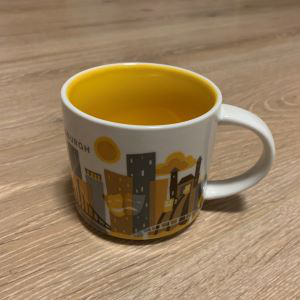

In [57]:
# Download an example image
IM_URL = "https://cvbp.blob.core.windows.net/public/images/cvbp_cup.jpg"
im_path = os.path.join(data_path(), "example.jpg")
urllib.request.urlretrieve(IM_URL, im_path)

im = Image.open(im_path)
im

Using the `predict()` method, we ask the model to detect how many objects and what they are on this image.  In this case, the only object is "cup".

In [58]:
detections = detector.predict(im)

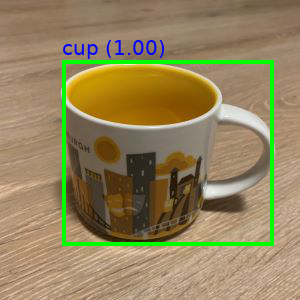

In [59]:
plot_boxes(im, detections["det_bboxes"], plot_settings=PlotSettings(rect_color=(0, 255, 0)))

In [8]:
detections

[{Bbox object: [left=61, top=59, right=273, bottom=244] | <cup> | label:47 | path:None} | score: 0.9996309280395508]

## From WebCam Stream

Now, we use a WebCam stream for object detection. We use `ipywebrtc` to start a webcam and get the video stream which is sent to the notebook's widget. Note that Jupyter widgets are quite unstable - if the widget below does not show then see the "Troubleshooting" section in this [FAQ](../classification/FAQ.md) for possible fixes. 

In [49]:
# Webcam
w_cam = CameraStream(
    constraints={
        'facing_mode': 'user',
        'audio': False,
        'video': { 'width': 200, 'height': 200 }
    },
    layout=Layout(width='200px')
)
# Image recorder for taking a snapshot
w_imrecorder = ImageRecorder(stream=w_cam, layout=Layout(padding='0 0 0 50px'))
# Label widget to show our object detection results
w_im = widgets.Image(layout=Layout(width='200px'))
output = widgets.Output() #KIP

@output.capture() #KIP

def detect_frame(_):
    """ Detect objects on an image snapshot by using a pretrained model
    """
    # Once capturing started, remove the capture widget since we don't need it anymore
    if w_imrecorder.layout.display != 'none':
        w_imrecorder.layout.display = 'none'
        
    try:
        # Get the image and convert to RGB
        im = Image.open(io.BytesIO(w_imrecorder.image.value)).convert('RGB')
        
        # Process the captured image
        detections = detector.predict(im)
        plot_boxes(im, detections["det_bboxes"], plot_settings=PlotSettings(rect_color=(0, 255, 0)))
        
        # Convert the processed image back into the image widget for display
        f = io.BytesIO()
        im.save(f, format='png')
        w_im.value = f.getvalue()
        
    except OSError:
        # If im_recorder doesn't have valid image data, skip it. 
        pass
    
    # Taking the next snapshot programmatically
    w_imrecorder.recording = True

# Register detect_frame as a callback. Will be called whenever image.value changes. 
w_imrecorder.image.observe(detect_frame, 'value')
w_im.observe(detect_frame,'value') #KIP

In [50]:
# Show widgets
HBox([w_cam, w_imrecorder, w_im, output])

In [26]:
# Webcam
w_cam = CameraStream(
    constraints={
        'facing_mode': 'user',
        'audio': False,
        'video': { 'width': 200, 'height': 200 }
    },
    layout=Layout(width='200px')
)
# Image recorder for taking a snapshot
w_imrecorder = ImageRecorder(stream=w_cam, layout=Layout(padding='0 0 0 50px'))
# Label widget to show our object detection results
w_im = widgets.Image(layout=Layout(width='200px'))

# def detect_frame(_):
#     """ Detect objects on an image snapshot by using a pretrained model
#     """
#     # Once capturing started, remove the capture widget since we don't need it anymore
#     if w_imrecorder.layout.display != 'none':
#         w_imrecorder.layout.display = 'none'
        
#     try:
#         # Get the image and convert to RGB
#         im = Image.open(io.BytesIO(w_imrecorder.image.value)).convert('RGB')
        
#         # Process the captured image
#         detections = detector.predict(im)
#         plot_boxes(im, detections["det_bboxes"], plot_settings=PlotSettings(rect_color=(0, 255, 0)))
        
#         # Convert the processed image back into the image widget for display
#         f = io.BytesIO()
#         im.save(f, format='png')
#         w_im.value = f.getvalue()
        
#     except OSError:
#         # If im_recorder doesn't have valid image data, skip it. 
#         pass
    
#     # Taking the next snapshot programmatically
#     w_imrecorder.recording = True

# # Register detect_frame as a callback. Will be called whenever image.value changes. 
# w_imrecorder.image.observe(detect_frame, 'value')

In [31]:
# KIP
VBox([w_cam, w_imrecorder, w_im])


In [28]:
w_imrecorder.image.observe(detect_frame, 'value')

Now, click the **capture button** in the widget to start object detection. Labels and bounding boxes are displayed to show the most probable objects predicted by the model for an image snapshot.

![Example Webcam Image](media/00_webcam_snapshot.png)

In [15]:
# Webcam for video
w_cam = CameraStream(
    constraints={
        'facing_mode': 'user',
        'audio': False,
        'video': { 'width': 200, 'height': 200 }
    },
    layout=Layout(width='200px')
)
# Image recorder for taking a snapshot
w_imrecorder = VideoRecorder(stream=w_cam, layout=Layout(padding='0 0 0 50px')) #KIP
# Label widget to show our object detection results
w_im = widgets.Image(layout=Layout(width='200px'))

# def detect_frame(_):
#     """ Detect objects on an image snapshot by using a pretrained model
#     """
#     # Once capturing started, remove the capture widget since we don't need it anymore
#     if w_imrecorder.layout.display != 'none':
#         w_imrecorder.layout.display = 'none'
        
#     try:
#         # Get the image and convert to RGB
#         im = Image.open(io.BytesIO(w_imrecorder.image.value)).convert('RGB')
        
#         # Process the captured image
#         detections = detector.predict(im)
#         plot_boxes(im, detections["det_bboxes"], plot_settings=PlotSettings(rect_color=(0, 255, 0)))
        
#         # Convert the processed image back into the image widget for display
#         f = io.BytesIO()
#         im.save(f, format='png')
#         w_im.value = f.getvalue()
        
#     except OSError:
#         # If im_recorder doesn't have valid image data, skip it. 
#         pass
    
#     # Taking the next snapshot programmatically
#     w_imrecorder.recording = True

# # Register detect_frame as a callback. Will be called whenever image.value changes. 
# w_imrecorder.image.observe(detect_frame, 'value')

In [16]:
# Show widgets
HBox([w_cam, w_imrecorder, w_im])

# Conclusion
In this notebook, we used a simple example to demonstrate how to use a pretrained model to detect objects on images. The model is limited to only predict object labels that are part of the COCO training samples. In the [training introduction notebook](01_training_introduction.ipynb), we will learn how to fine-tune a model on our own data.

In [11]:
# Stop the model and webcam
Widget.close_all()

In [12]:
# Preserve some of the notebook outputs
detections = [
    (x.label_idx, x.label_name, [(x.left, x.top), (x.right, x.bottom)]) 
    for x in detections["det_bboxes"]
]
sb.glue("detection_bounding_box", detections)